# HR Analysis by Zhen Wang

#1.library & dataset (hru.csv)


The dataset 'hru.csv' is intermediate pre-processed data, the original dataset is named as 'hr.csv'.

In [341]:
!pip install umap-learn -q
!pip install xgboost -U -q
!pip install sklearn -U -q
!pip install shap
!pip install joypy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [342]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import altair as alt
import seaborn as sns
sns.set()
import shap
import joypy

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import warnings
import itertools
import pickle
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
hru=pd.read_csv("hru.csv")

#2.basic info

##2.1 overall

In [ ]:
hru.head(5)

In [224]:
hru.columns

Index(['employee_id', 'age', 'dfh', 'edu', 'job_level', 'income',
       'stock_option', 'salary_increase', 'training', 'years_company',
       'years_promotion', 'years_manager', 'num_companiesworked',
       'years_working', 'performance', 'job_involvement',
       'satisfaction_environment', 'satisfaction_job', 'wlb', 'attrition_d',
       'business_travel', 'department', 'edu_field', 'gender', 'job_role',
       'marital', 'cluster'],
      dtype='object')

In [ ]:
hru.info()

## 2.2 attrition

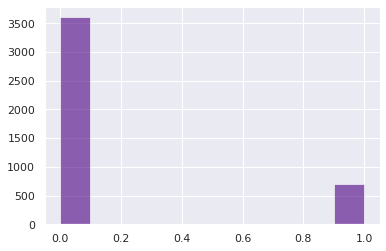

In [225]:
hru.attrition_d.hist(color=['indigo'],alpha=0.6)

In [7]:
hru.attrition_d.value_counts()

0    3605
1     695
Name: attrition_d, dtype: int64

The attrition rate (~19.27%) calculated on the cover of PDF comes form here.

#3.correlation analysis

In this section, we analyse the pearson correlation coefficient and pairplot to get overview of the relationship of variables.

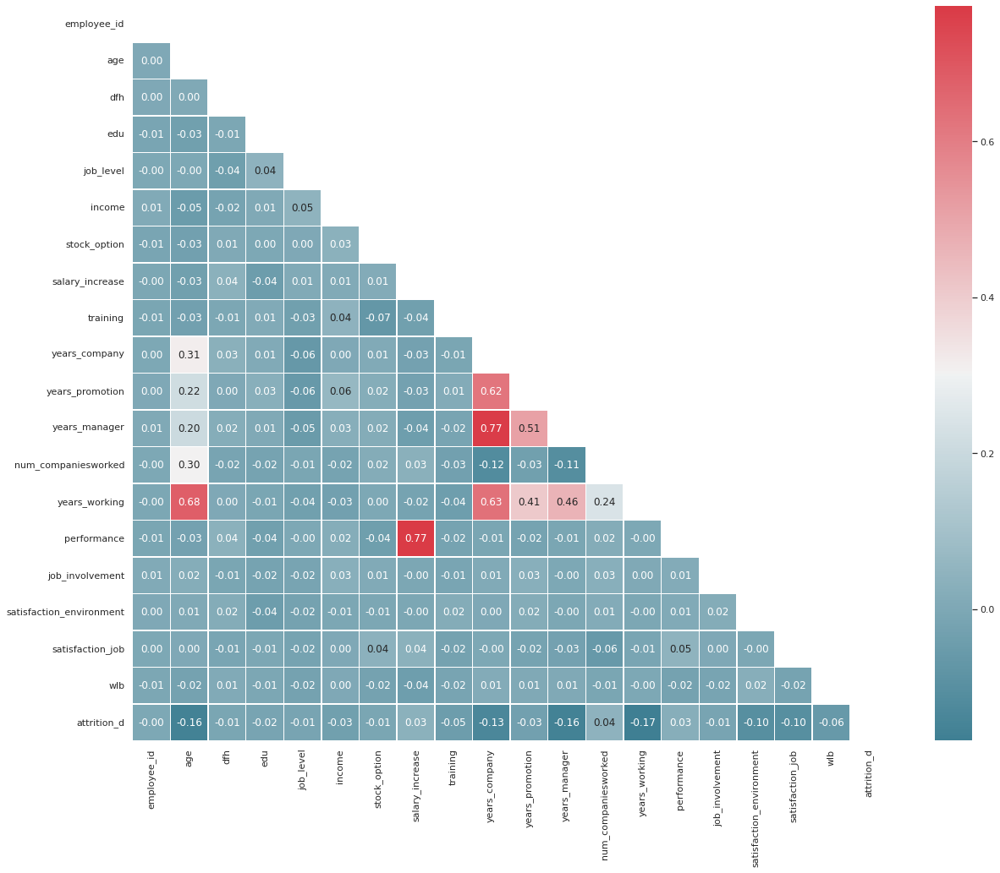

In [10]:
cor = hru.corr()
sns.set_style("whitegrid") #remove grid line
fig, ax = plt.subplots(figsize=(20, 16))
colormap = sns.diverging_palette(220, 10, as_cmap = True)
dropvals = np.zeros_like(cor)
dropvals[np.triu_indices_from(dropvals)] = True
sns.heatmap(cor, cmap = colormap, linewidths = .5, annot = True, fmt = ".2f", mask = dropvals)
plt.show()
fig.savefig('correlation.png',bbox_inches='tight', pad_inches=0.01)

The conclusion on page2 of PDF comes from here:
- High performance can predict high salary increase.
- People who stay longer years at company, more likely to have long promotion interval time and have longer time with his/her manager.
- For predicting attrition, no variables have more than 0.2abs correlation.

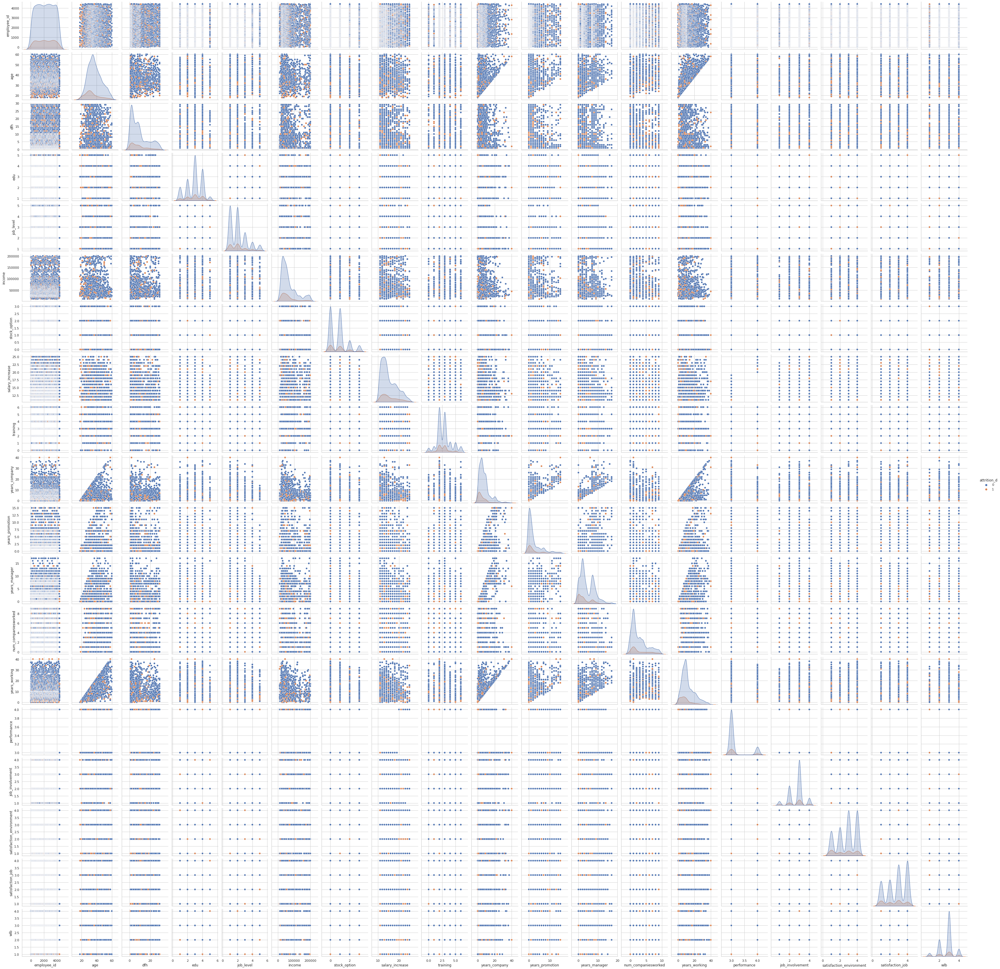

In [11]:
sns.pairplot(hru, hue = 'attrition_d')

# 4.cluster analysis

-In this case, we already know the goal is to analyze attrition problem. If we use attrition as label to analyze employees, this is SML. But here, I want to figure out what's the important features computer thinks before I set the labels, in order to see if attrition is a obvious feature to segment employees.

-The result of cluster analysis is there are four clusters of employess in total, and I draw the profile of each cluster in PDF. Besides, the attrition is an important feature to divide junior staff with average performance.


In [15]:
#for implementing cluster analysis, we use 'hruc' to select non-object var
hruc=hru.iloc[:,0:20]

In [27]:
#long loading time...but a great drawer
import umap

In [20]:
#use StandardScaler to get var mean=0, variance=1
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
hruc_scaled=scaler.fit_transform(hruc)

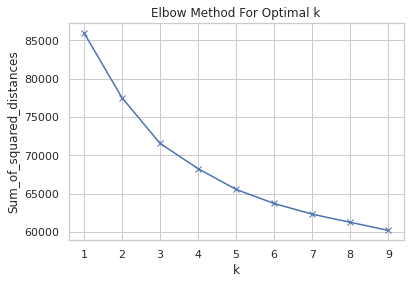

In [23]:
#use 'elbow method' to choose the optimal cluster amount, it is 4. Actually I have also tried to use 5 clusters, but it cut the sample too small
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(hruc_scaled)
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [28]:
umap_scaler = umap.UMAP()

In [29]:
embeddings = umap_scaler.fit_transform(hruc_scaled)

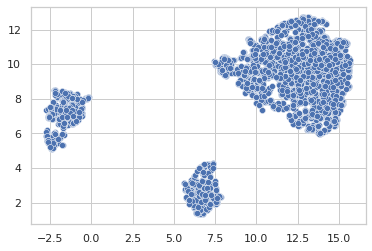

In [31]:
sns.scatterplot(embeddings[:,0],embeddings[:,1])

In [32]:
vis_data = pd.DataFrame(embeddings)
vis_data['salary_increase'] = hru['salary_increase']
vis_data['satisfaction_job'] = hru['satisfaction_job']
vis_data['performance'] = hru['performance']
vis_data.columns = ['x', 'y','salary_increase','satisfaction_job','performance']

In [43]:
alt.Chart(vis_data).mark_circle(size=60).encode(
    x='x',
    y='y',
    tooltip=['salary_increase', 'satisfaction_job','performance']
).interactive()

alt.Chart(...)

In [36]:
from sklearn.cluster import KMeans
cluster_employee = KMeans(n_clusters=4)

In [37]:
cluster_employee.fit(hruc_scaled)

KMeans(n_clusters=4)

In [40]:
#here we add a new column of cluster (0,1,2,3) in hru dataset 
hru['cluster'] = cluster_employee.labels_

In [52]:
vis_data = pd.DataFrame(embeddings)
vis_data['performance'] = hru['performance']
vis_data['age'] = hru['age']
vis_data['cluster'] = hru['cluster']
vis_data['attrition_d'] = hru['attrition_d']
vis_data.columns = ['x', 'y','performance','age','cluster','attrition_d']

In [53]:
alt.Chart(vis_data).mark_circle(size=60).encode(
    x='x',
    y='y',
    tooltip=['performance','age','cluster','attrition_d'],
    color='cluster'
).interactive()

alt.Chart(...)

In [54]:
cluster_star=hru[hru['cluster'] == 0] #star:high performance, low age, low attrition...

In [56]:
cluster_senior=hru[hru['cluster'] == 1] #senior_low performance, high age, low attrition...

In [57]:
cluster_loyal=hru[hru['cluster'] == 2] #loyal:low performance, low age, low attrition...

In [58]:
cluster_flowerheart=hru[hru['cluster'] == 3] #flowerheart:low performance, low age, high attrition...

In [60]:
cluster_loyalandflowerheart=pd.concat([cluster_loyal,cluster_flowerheart])

The cluster will have slight change if we run again, so here we output the data of different cluster as well as important combination (e.g.loyal junior and flowerheart junior)for future analysis.

In [61]:
outputpath='/content/cluster_star.csv'
cluster_star.to_csv(outputpath,sep=',',index=False,header=True)

In [62]:
outputpath='/content/cluster_senior.csv'
cluster_senior.to_csv(outputpath,sep=',',index=False,header=True)

In [63]:
outputpath='/content/cluster_loyal.csv'
cluster_loyal.to_csv(outputpath,sep=',',index=False,header=True)

In [64]:
outputpath='/content/cluster_flowerheart.csv'
cluster_flowerheart.to_csv(outputpath,sep=',',index=False,header=True)

In [65]:
outputpath='/content/cluster_loyalandflowerheart.csv'
cluster_loyalandflowerheart.to_csv(outputpath,sep=',',index=False,header=True)

The following is the code for input the cluster documents.

In [67]:
cluster_star=pd.read_csv("cluster_star.csv")
cluster_senior=pd.read_csv("cluster_senior.csv")
cluster_loyal=pd.read_csv("cluster_loyal.csv")
cluster_flowerheart=pd.read_csv("cluster_flowerheart.csv")
cluster_cluster_loyalandflowerheart=pd.read_csv("cluster_loyalandflowerheart.csv")

# 5.evaluation classication models

So far, we have done the cluster analysis. Now, we can analyze the rationale of attrition on the basis of four clusters. Before we start, we can evaluation which classication model will have the best performance.

In [68]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, KFold, train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

## 5.1 sample of normal junior

In [77]:
#we narrow down the sample between 'normal loyal junior' and 'normal flower heart', because they are the most similar except for attrition
evaluation_lf= cluster_loyalandflowerheart[['age', 'dfh', 'edu', 'job_level', 'income','stock_option', 'salary_increase', 'training', 'years_company','years_promotion', 'years_manager', 'num_companiesworked','years_working', 'performance', 'job_involvement','satisfaction_environment', 'satisfaction_job', 'wlb','attrition_d']]

In [78]:
X=evaluation_lf.drop("attrition_d",axis=1).values
y=evaluation_lf["attrition_d"].values

### 5.1.1 deal with imblance

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30)

In [79]:
print("Before undersampling: ", Counter(y_train))

Before undersampling:  Counter({0: 1616, 1: 362})


In [80]:
undersample = RandomUnderSampler(sampling_strategy='majority')

In [81]:
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [82]:
print("After undersampling: ", Counter(y_train_under))

After undersampling:  Counter({0: 362, 1: 362})


In [83]:
X=X_train_under

In [84]:
y=y_train_under

### 5.1.2 evaluate the model

In [85]:
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42)
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

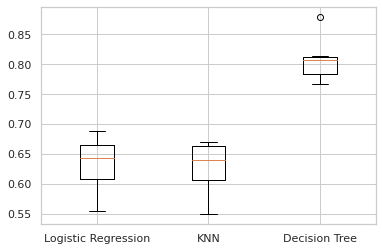

In [86]:
models={"Logistic Regression":LogisticRegression(),"KNN":KNeighborsClassifier(),"Decision Tree":DecisionTreeClassifier()}
results=[]
for model in models.values():
	kf=KFold(n_splits=6,random_state=42,shuffle=True)
	cv_results=cross_val_score(model,X_train_scaled,y_train,cv=kf)
	results.append(cv_results)
plt.boxplot(results,labels=models.keys())
plt.show()

In [87]:
for name, model in models.items():
	model.fit(X_train_scaled,y_train)
	test_score=model.score(X_test_scaled,y_test)
	print("{} Test Set Accuracy:{}".format(name,test_score))

Logistic Regression Test Set Accuracy:0.6408839779005525
KNN Test Set Accuracy:0.6464088397790055
Decision Tree Test Set Accuracy:0.7900552486187845


We can draw a conclusion that decision tree model is the most suitable one due to high accuracy score for sample 'cluster_loyalandflowerheart'

### 5.1.3 detect feature with Lasso

In [75]:
from sklearn.linear_model import Lasso
scores=[]
for alpha in [0.1,1.0,10.0,20.0,50.0]:
	lasso=Lasso(alpha=alpha)
	lasso.fit(X_train,y_train)
	lasso_pred=lasso.predict(X_test)
	scores.append(lasso.score(X_test,y_test))
print(scores)

[0.031033774131932534, -9.672529177273681e-05, -7.766991615620888e-05, -5.7016654086972096e-05, -9.875537423376102e-07]


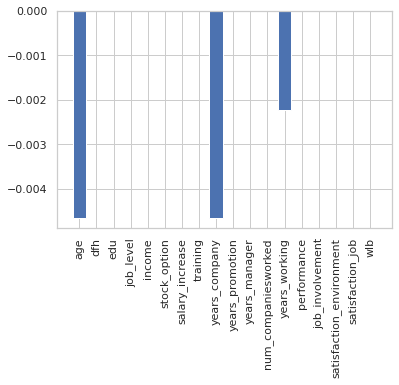

In [88]:
from sklearn.linear_model import Lasso
X=evaluation_lf.drop("attrition_d",axis=1).values
y=evaluation_lf["attrition_d"].values
names=evaluation_lf.drop("attrition_d",axis=1).columns
			
lasso=Lasso(alpha=0.1)
lasso_coef=lasso.fit(X,y).coef_
			
plt.bar(names,lasso_coef)
plt.xticks(rotation=90)
plt.show()

## 5.2 overall sample

In [89]:
evaluation_hru = hru[['age', 'dfh', 'edu', 'job_level', 'income','stock_option', 'salary_increase', 'training', 'years_company','years_promotion', 'years_manager', 'num_companiesworked','years_working', 'performance', 'job_involvement','satisfaction_environment', 'satisfaction_job', 'wlb','attrition_d']]

In [90]:
X=evaluation_hru.drop("attrition_d",axis=1).values
y=evaluation_hru["attrition_d"].values

### 5.2.1 deal with imblance

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30)

In [92]:
print("Before undersampling: ", Counter(y_train))

Before undersampling:  Counter({0: 2516, 1: 494})


In [93]:
undersample = RandomUnderSampler(sampling_strategy='majority')

In [94]:
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [95]:
print("After undersampling: ", Counter(y_train_under))

After undersampling:  Counter({0: 494, 1: 494})


In [96]:
X=X_train_under

In [97]:
y=y_train_under

### 5.2.2 evaluate the model

In [98]:
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42)
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

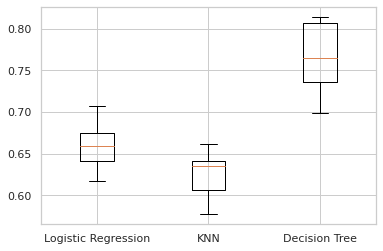

In [99]:
models={"Logistic Regression":LogisticRegression(),"KNN":KNeighborsClassifier(),"Decision Tree":DecisionTreeClassifier()}
results=[]
for model in models.values():
	kf=KFold(n_splits=6,random_state=42,shuffle=True)
	cv_results=cross_val_score(model,X_train_scaled,y_train,cv=kf)
	results.append(cv_results)
plt.boxplot(results,labels=models.keys())
plt.show()

In [100]:
for name, model in models.items():
	model.fit(X_train_scaled,y_train)
	test_score=model.score(X_test_scaled,y_test)
	print("{} Test Set Accuracy:{}".format(name,test_score))

Logistic Regression Test Set Accuracy:0.6356275303643725
KNN Test Set Accuracy:0.6680161943319838
Decision Tree Test Set Accuracy:0.8178137651821862


We can draw a conclusion that decision tree model is the most suitable one due to high accuracy score for overall sample as well.

### 5.2.3 detect feature with Lasso

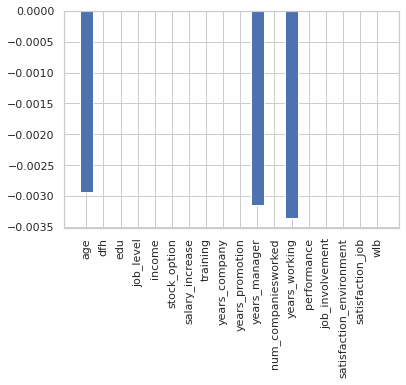

In [101]:
from sklearn.linear_model import Lasso
X=evaluation_hru.drop("attrition_d",axis=1).values
y=evaluation_hru["attrition_d"].values
names=evaluation_hru.drop("attrition_d",axis=1).columns
			
lasso=Lasso(alpha=0.1)
lasso_coef=lasso.fit(X,y).coef_
			
plt.bar(names,lasso_coef)
plt.xticks(rotation=90)
plt.show()

# 6.predict attrition with xgboost

## 6.1 overall sample

In [104]:
hru_xgb = hru[['age', 'dfh', 'edu', 'job_level', 'income','stock_option', 'salary_increase', 'training', 'years_company','years_promotion', 'years_manager', 'num_companiesworked','years_working', 'performance', 'job_involvement','satisfaction_environment', 'satisfaction_job', 'wlb','attrition_d','business_travel', 'department', 'edu_field', 'gender', 'job_role','marital']]

In [105]:
X = hru_xgb.drop(["attrition_d"],axis=1)

In [106]:
y = hru_xgb.attrition_d

### 6.1.1 deal with imbalance

In [107]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30)

In [108]:
print("Before undersampling: ", Counter(y_train))

Before undersampling:  Counter({0: 2510, 1: 500})


In [109]:
undersample = RandomUnderSampler(sampling_strategy='majority')

In [110]:
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [111]:
print("After undersampling: ", Counter(y_train_under))

After undersampling:  Counter({0: 500, 1: 500})


In [112]:
X=X_train_under

In [113]:
y=y_train_under

### 6.1.2 get dummy with OneHotEncoder

In [117]:
ohe_X = OneHotEncoder(sparse=False)

In [118]:
X_ohe = ohe_X.fit_transform(X.iloc[:,18:25]) 

In [119]:
columns_X_ohe = list(itertools.chain(*ohe_X.categories_))

In [120]:
X_cat = pd.DataFrame(X_ohe, columns = columns_X_ohe)

In [121]:
X_cat

,Non-Travel,Travel_Frequently,Travel_Rarely,Human Resources,Research & Development,Sales,Human Resources,Life Sciences,Marketing,Medical,...,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married,Single
0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
996,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
997,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
998,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [122]:
scaler = StandardScaler()

In [123]:
transformed_nummerical = scaler.fit_transform(X.iloc[:,0:18])

In [124]:
X.iloc[:,0:18] = transformed_nummerical

In [125]:
X

,age,dfh,edu,job_level,income,stock_option,salary_increase,training,years_company,years_promotion,...,job_involvement,satisfaction_environment,satisfaction_job,wlb,business_travel,department,edu_field,gender,job_role,marital
0,2.613626,-0.170004,-0.86835,2.734015,-0.216695,-0.943862,1.196672,0.225156,-0.704298,-0.047767,...,1.751909,-1.414671,-1.394460,0.410244,Travel_Rarely,Research & Development,Life Sciences,Female,Laboratory Technician,Single
1,0.055010,-1.050204,1.11645,0.877929,-0.484501,0.237442,-1.212196,-0.596582,1.105814,1.201039,...,-2.309703,0.358100,1.251574,-0.930422,Travel_Rarely,Human Resources,Life Sciences,Female,Research Scientist,Single
2,-0.478035,-0.924461,-1.86075,-0.978158,0.744078,-0.943862,0.393716,1.868633,0.612147,1.825442,...,-0.955833,0.358100,0.369563,0.410244,Travel_Frequently,Research & Development,Life Sciences,Female,Manager,Married
3,1.654145,0.835938,0.12405,0.877929,0.684030,2.600051,-0.141588,-2.240059,2.257703,0.576636,...,0.398038,-1.414671,0.369563,-0.930422,Travel_Rarely,Sales,Medical,Male,Research Scientist,Married
4,-1.011080,-0.170004,0.12405,-0.978158,-0.719873,-0.943862,-0.944544,-0.596582,-0.210631,-0.359968,...,-0.955833,0.358100,1.251574,0.410244,Travel_Rarely,Sales,Marketing,Female,Healthcare Representative,Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.121100,0.081481,0.12405,-0.978158,-0.415467,0.237442,-1.212196,-0.596582,0.447591,0.264435,...,0.398038,1.244485,-0.512449,1.750909,Travel_Rarely,Research & Development,Medical,Male,Sales Executive,Married
996,-0.371426,1.716138,-1.86075,0.877929,-0.843695,-0.943862,-1.212196,-0.596582,-0.539742,-0.359968,...,0.398038,1.244485,0.369563,-2.271088,Travel_Rarely,Sales,Life Sciences,Male,Healthcare Representative,Single
997,0.801273,-1.050204,1.11645,0.877929,0.293058,0.237442,-0.944544,0.225156,-0.868854,-0.672170,...,0.398038,0.358100,0.369563,0.410244,Travel_Frequently,Research & Development,Other,Male,Sales Executive,Married
998,-1.544125,1.338909,-0.86835,1.805972,-0.214941,0.237442,-0.409240,-0.596582,-0.704298,-0.047767,...,0.398038,-1.414671,0.369563,-2.271088,Travel_Frequently,Research & Development,Medical,Female,Research Scientist,Single


In [126]:
X.index = range(len(X))
X_cat.index = range(len(X_cat))

In [127]:
X_enc = X.iloc[:,0:18].join(X_cat)

In [128]:
X_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age                        1000 non-null   float64
 1   dfh                        1000 non-null   float64
 2   edu                        1000 non-null   float64
 3   job_level                  1000 non-null   float64
 4   income                     1000 non-null   float64
 5   stock_option               1000 non-null   float64
 6   salary_increase            1000 non-null   float64
 7   training                   1000 non-null   float64
 8   years_company              1000 non-null   float64
 9   years_promotion            1000 non-null   float64
 10  years_manager              1000 non-null   float64
 11  num_companiesworked        1000 non-null   float64
 12  years_working              1000 non-null   float64
 13  performance                1000 non-null   float6

In [129]:
#for we have 3 columns named 'Human Resources', we need to separate them by the real meaning (department, edu and jobrole)
X_enc['hr_department']=X_enc.iloc[:,21]
X_enc['hr_edu']=X_enc.iloc[:,24]
X_enc['hr_jobrole']=X_enc.iloc[:,33]

In [130]:
X_enc_new=X_enc.drop(["Human Resources"],axis=1)

### 6.1.3 evaluate sample with ROC AUC

In [131]:
from sklearn.model_selection import train_test_split

In [132]:
X_train, X_test, y_train, y_test = train_test_split(X_enc_new, y, test_size=0.2)

In [133]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, roc_auc_score

model=SVC()
clf_under = model.fit(X_train, y_train)
pred_under = clf_under.predict(X_test)

print("ROC AUC score for undersampled data: ", roc_auc_score(y_test, pred_under))

ROC AUC score for undersampled data:  0.8030043351144268


The socre means the prediction is ~20% better than random guess.

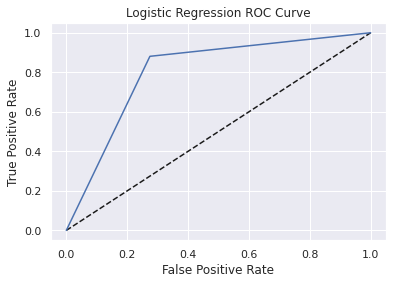

In [134]:
from sklearn.metrics import roc_curve
fpr, tpr, thresholds=roc_curve(y_test,pred_under)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve')
plt.show()

We can also draw the ROC curve to evaluate it. Here the curve is of great shape.

### 6.1.4 train model

In [136]:
model_xgb = XGBRegressor()

In [137]:
X_train.columns

Index(['age', 'dfh', 'edu', 'job_level', 'income', 'stock_option',
       'salary_increase', 'training', 'years_company', 'years_promotion',
       'years_manager', 'num_companiesworked', 'years_working', 'performance',
       'job_involvement', 'satisfaction_environment', 'satisfaction_job',
       'wlb', 'Non-Travel', 'Travel_Frequently', 'Travel_Rarely',
       'Research & Development', 'Sales', 'Life Sciences', 'Marketing',
       'Medical', 'Other', 'Technical Degree', 'Female', 'Male',
       'Healthcare Representative', 'Laboratory Technician', 'Manager',
       'Manufacturing Director', 'Research Director', 'Research Scientist',
       'Sales Executive', 'Sales Representative', 'Divorced', 'Married',
       'Single', 'hr_department', 'hr_edu', 'hr_jobrole'],
      dtype='object')

In [138]:
model_xgb.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [139]:
print('Model XGB' + ' ' + str(model_xgb.score(X_train, y_train)))

Model XGB 0.9999318148517847


In [140]:
y_pred_train = model_xgb.predict(X_train)

In [141]:
mean_squared_error(y_train, y_pred_train, squared=False)

0.004127669726492015

In [142]:
y_pred = model_xgb.predict(X_test)

In [143]:
mean_squared_error(y_test, y_pred, squared=False)

0.2968277817767985

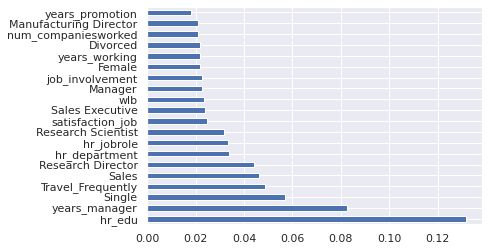

In [144]:
feat_importances = pd.Series(model_xgb.feature_importances_, index=X_enc_new.columns)
feat_importances.nlargest(20).plot(kind='barh')

In [148]:
explainer = shap.TreeExplainer(model_xgb)

In [149]:
shap_values = explainer.shap_values(X_enc_new)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


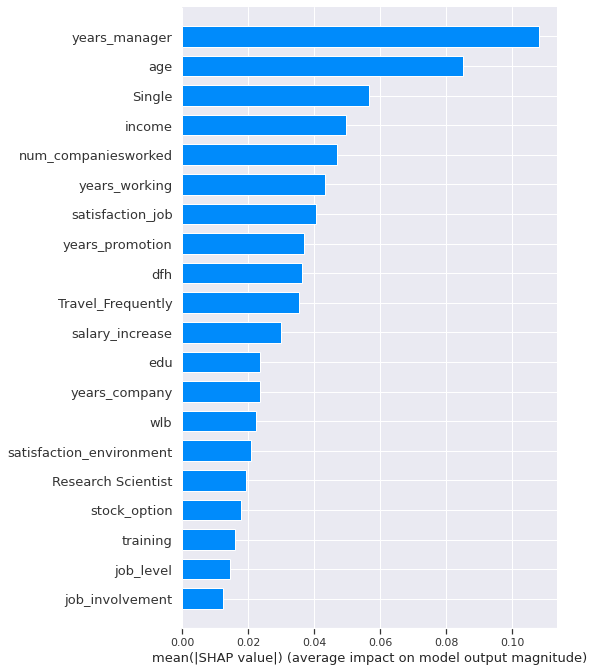

In [150]:
shap.summary_plot(shap_values, X_enc_new, plot_type="bar")

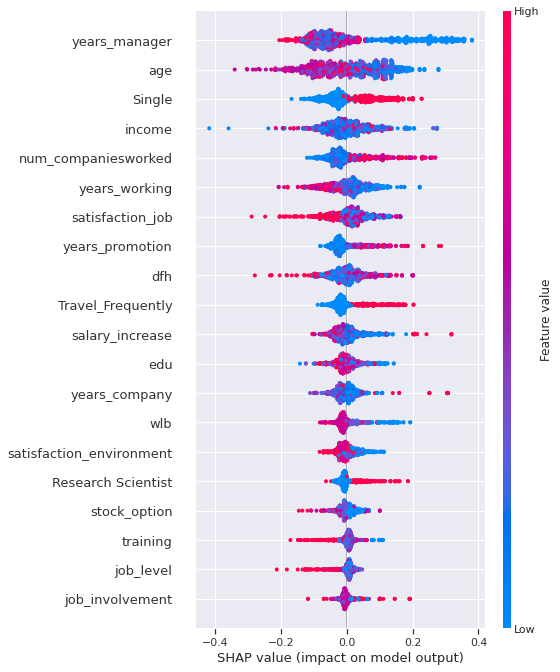

In [151]:
shap.summary_plot(shap_values, X_enc_new)

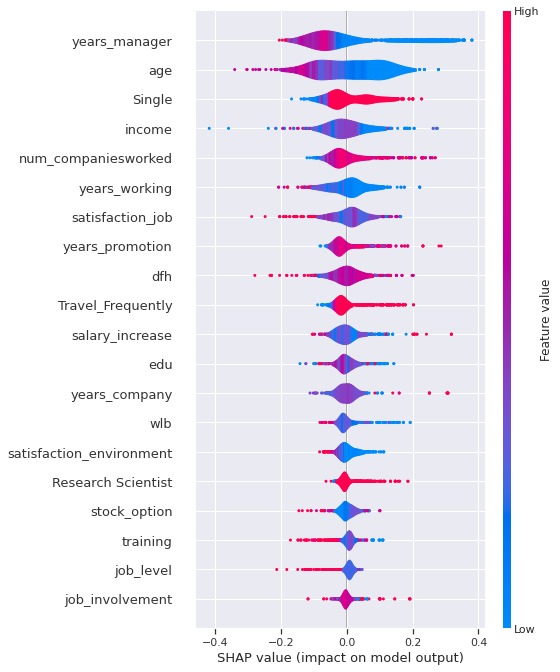

In [152]:
shap.summary_plot(shap_values, X_enc_new, plot_type='violin')

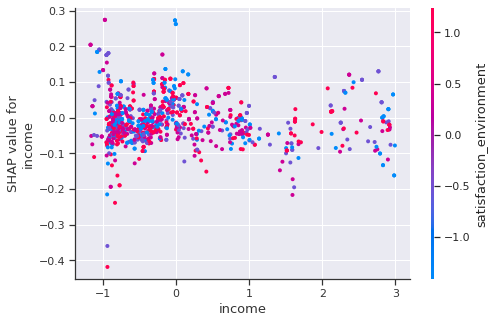

In [153]:
shap.dependence_plot("income", shap_values, X_enc_new)

In [158]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1,:], X_enc_new.iloc[1,:])

### 6.1.5 output model

In [160]:
model_xgb.save_model('model_xgb_attrition.json')

In [165]:
pickle.dump(scaler, open('scaler_attrition.pkl','wb'))

In [166]:
pickle.dump(ohe_X, open('ohe_attrition.pkl','wb'))

In [167]:
pickle.dump(model_xgb, open('model_xgb_attrition.pkl','wb'))

In [168]:
pickle.dump(shap_values, open('shap_values_attrition.pkl','wb'))

In [181]:
X.to_json('X_attrition.json')
hru_xgb.to_json('hru_attrition.json')

### 6.1.6 [predict system]

In [182]:
X = pd.read_json('X_attrition.json')

In [183]:
model_xgb = pickle.load(open('model_xgb_attrition.pkl','rb'))

In [184]:
scaler = pickle.load(open('scaler_attrition.pkl','rb'))

In [185]:
hru_forpredictattrition = pd.read_json('hru_attrition.json')

In [186]:
shap_values = pickle.load(open('shap_values_attrition.pkl','rb'))
explainer = shap.TreeExplainer(model_xgb)

In [187]:
hru_forpredictattrition.columns

Index(['age', 'dfh', 'edu', 'job_level', 'income', 'stock_option',
       'salary_increase', 'training', 'years_company', 'years_promotion',
       'years_manager', 'num_companiesworked', 'years_working', 'performance',
       'job_involvement', 'satisfaction_environment', 'satisfaction_job',
       'wlb', 'attrition_d', 'business_travel', 'department', 'edu_field',
       'gender', 'job_role', 'marital'],
      dtype='object')

In [188]:
hru_forpredictattrition.iloc[0].values

array([51, 6, 2, 1, 131160, 0, 11, 6, 1, 0, 0, 1, 1, 3, 3, 3, 4, 2, 0,
       'Travel_Rarely', 'Sales', 'Life Sciences', 'Female',
       'Healthcare Representative', 'Married'], dtype=object)

In [189]:
ohe = pickle.load(open('ohe_attrition.pkl','rb'))

In [190]:
cats = list(itertools.chain(*ohe.categories_))

In [194]:
new_df = pd.DataFrame({'business_travel':'Travel_Rarely',
              'department':'Sales',
              'edu_field':'Life Sciences',
              'gender':'Female',
              'job_role':'Healthcare Representative',
              'marital':'Married'}, index=[0])

In [195]:
new_values_cat = pd.DataFrame(ohe.transform(new_df), columns = cats , index=[0])

In [198]:
new_df = pd.DataFrame({'age': 51,
                       'dfh': 3,
                       'edu':4,
                       'job_level':5,
                       'income':130000,
                       'stock_option':4,
                       'salary_increase':12,
                       'training':6,
                       'years_company':8,
                       'years_promotion':2,
                       'years_manager':3,
                       'num_companiesworked':2,
                       'years_working':4,
                       'performance':5,
                       'job_involvement':5,
                       'satisfaction_environment':3,
                       'satisfaction_job':3,
                       'wlb':4}, index=[0])

In [199]:
new_values_num = pd.DataFrame(scaler.transform(new_df), columns = new_df.columns, index=[0])

In [200]:
line_to_pred = new_values_num.join(new_values_cat)

In [201]:
line_to_pred

,age,dfh,edu,job_level,income,stock_option,salary_increase,training,years_company,years_promotion,...,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married,Single
0,1.654145,-0.798718,1.11645,2.734015,1.464438,3.781356,-0.944544,2.690372,0.283036,-0.047767,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [206]:
line_to_pred.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 0 to 0
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age                        1 non-null      float64
 1   dfh                        1 non-null      float64
 2   edu                        1 non-null      float64
 3   job_level                  1 non-null      float64
 4   income                     1 non-null      float64
 5   stock_option               1 non-null      float64
 6   salary_increase            1 non-null      float64
 7   training                   1 non-null      float64
 8   years_company              1 non-null      float64
 9   years_promotion            1 non-null      float64
 10  years_manager              1 non-null      float64
 11  num_companiesworked        1 non-null      float64
 12  years_working              1 non-null      float64
 13  performance                1 non-null      float64
 14

In [213]:
line_to_pred['hr_department']=X_enc.iloc[:,21]
line_to_pred['hr_edu']=X_enc.iloc[:,24]
line_to_pred['hr_jobrole']=X_enc.iloc[:,33]

In [217]:
line_to_pred=line_to_pred.drop(["Human Resources"],axis=1)

In [218]:
model_xgb.predict(line_to_pred)

array([-0.20478016], dtype=float32)

In [216]:
line_to_pred.columns

Index(['age', 'dfh', 'edu', 'job_level', 'income', 'stock_option',
       'salary_increase', 'training', 'years_company', 'years_promotion',
       'years_manager', 'num_companiesworked', 'years_working', 'performance',
       'job_involvement', 'satisfaction_environment', 'satisfaction_job',
       'wlb', 'Non-Travel', 'Travel_Frequently', 'Travel_Rarely',
       'Human Resources', 'Research & Development', 'Sales', 'Human Resources',
       'Life Sciences', 'Marketing', 'Medical', 'Other', 'Technical Degree',
       'Female', 'Male', 'Healthcare Representative', 'Human Resources',
       'Laboratory Technician', 'Manager', 'Manufacturing Director',
       'Research Director', 'Research Scientist', 'Sales Executive',
       'Sales Representative', 'Divorced', 'Married', 'Single',
       'hr_department', 'hr_edu', 'hr_jobrole'],
      dtype='object')

In [219]:
shap_value = explainer.shap_values(line_to_pred)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_value, line_to_pred)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


## 6.2 sample of normal junior

In [221]:
cluster_loyalandflowerheart.columns

Index(['employee_id', 'age', 'dfh', 'edu', 'job_level', 'income',
       'stock_option', 'salary_increase', 'training', 'years_company',
       'years_promotion', 'years_manager', 'num_companiesworked',
       'years_working', 'performance', 'job_involvement',
       'satisfaction_environment', 'satisfaction_job', 'wlb', 'attrition_d',
       'business_travel', 'department', 'edu_field', 'gender', 'job_role',
       'marital', 'cluster'],
      dtype='object')

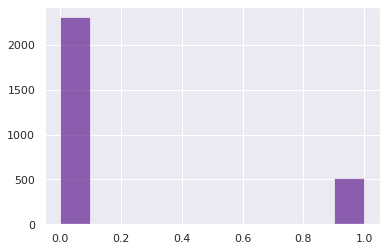

In [226]:
cluster_loyalandflowerheart.attrition_d.hist(color=['indigo'],alpha=0.6)

In [229]:
X = cluster_loyalandflowerheart.drop(["attrition_d"],axis=1)

In [230]:
y = cluster_loyalandflowerheart.attrition_d

### 6.1.1 deal with imbalance

In [231]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30)

In [232]:
print("Before undersampling: ", Counter(y_train))

Before undersampling:  Counter({0: 1636, 1: 342})


In [233]:
undersample = RandomUnderSampler(sampling_strategy='majority')

In [234]:
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [235]:
print("After undersampling: ", Counter(y_train_under))

After undersampling:  Counter({0: 342, 1: 342})


In [236]:
X=X_train_under

In [237]:
y=y_train_under

### 6.1.2 get dummy with OneHotEncoder

In [238]:
X_ohe = ohe_X.fit_transform(X.iloc[:,18:25]) 

In [239]:
columns_X_ohe = list(itertools.chain(*ohe_X.categories_))

In [240]:
X_cat = pd.DataFrame(X_ohe, columns = columns_X_ohe)

In [241]:
transformed_nummerical = scaler.fit_transform(X.iloc[:,0:18])

In [242]:
X.iloc[:,0:18] = transformed_nummerical

In [243]:
X.index = range(len(X))
X_cat.index = range(len(X_cat))

In [244]:
X_enc = X.iloc[:,0:18].join(X_cat)

In [245]:
X_enc['hr_department']=X_enc.iloc[:,21]
X_enc['hr_edu']=X_enc.iloc[:,24]
X_enc['hr_jobrole']=X_enc.iloc[:,33]

In [246]:
X_enc_new=X_enc.drop(["Human Resources"],axis=1)

### 6.1.3 train model

In [247]:
X_train, X_test, y_train, y_test = train_test_split(X_enc_new, y, test_size=0.2)

In [248]:
model_xgb.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [249]:
print('Model XGB' + ' ' + str(model_xgb.score(X_train, y_train)))

Model XGB 0.9999941855037062


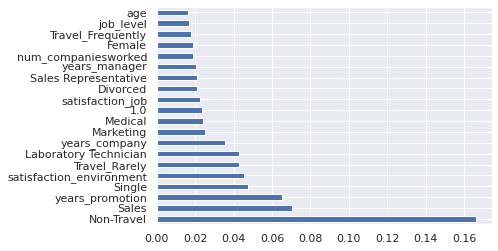

In [250]:
feat_importances = pd.Series(model_xgb.feature_importances_, index=X_enc_new.columns)
feat_importances.nlargest(20).plot(kind='barh')

In [251]:
explainer = shap.TreeExplainer(model_xgb)

In [252]:
shap_values = explainer.shap_values(X_enc_new)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


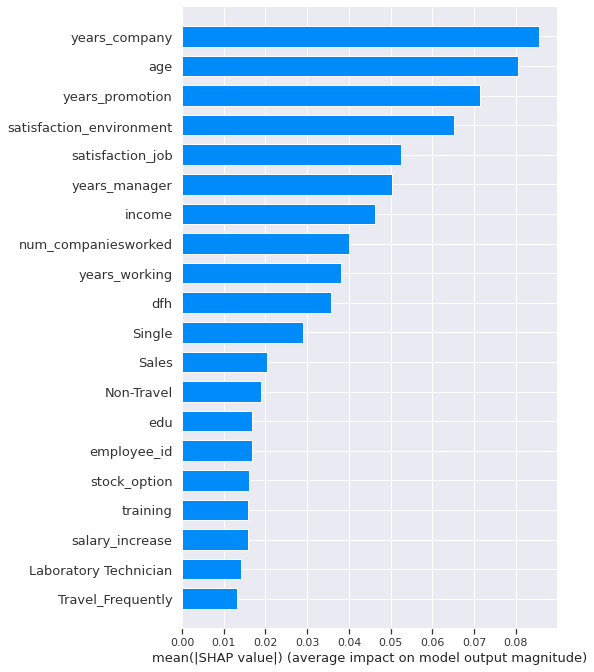

In [253]:
shap.summary_plot(shap_values, X_enc_new, plot_type="bar")

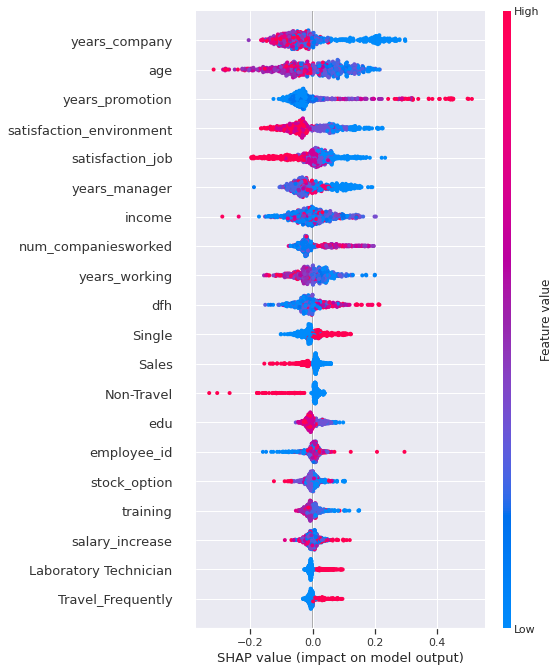

In [254]:
shap.summary_plot(shap_values, X_enc_new)

# 7.satisfcation analysis for flowerheart

In [291]:
cluster_flowerheart_satisfcation = cluster_flowerheart[['age', 'dfh', 'edu', 'job_level', 'income','stock_option', 'salary_increase', 'training', 'years_company','years_promotion', 'years_manager', 'num_companiesworked','years_working', 'performance', 'job_involvement','satisfaction_environment', 'satisfaction_job', 'wlb','attrition_d','business_travel', 'department', 'edu_field', 'gender', 'job_role','marital']]

In [293]:
X=cluster_flowerheart_satisfcation.drop(["satisfaction_job"],axis=1)

In [295]:
y = cluster_flowerheart_satisfcation.satisfaction_job

In [296]:
cluster_flowerheart_satisfcation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 519 entries, 0 to 518
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       519 non-null    int64  
 1   dfh                       519 non-null    int64  
 2   edu                       519 non-null    int64  
 3   job_level                 519 non-null    int64  
 4   income                    519 non-null    int64  
 5   stock_option              519 non-null    int64  
 6   salary_increase           519 non-null    int64  
 7   training                  519 non-null    int64  
 8   years_company             519 non-null    int64  
 9   years_promotion           519 non-null    int64  
 10  years_manager             519 non-null    int64  
 11  num_companiesworked       519 non-null    float64
 12  years_working             519 non-null    float64
 13  performance               519 non-null    int64  
 14  job_involv

In [297]:
X_ohe = ohe_X.fit_transform(X.iloc[:,18:24]) 

In [298]:
columns_X_ohe = list(itertools.chain(*ohe_X.categories_))

In [299]:
X_cat = pd.DataFrame(X_ohe, columns = columns_X_ohe)

In [300]:
X_cat

,Non-Travel,Travel_Frequently,Travel_Rarely,Human Resources,Research & Development,Sales,Human Resources,Life Sciences,Marketing,Medical,...,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married,Single
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
515,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
516,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
517,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [301]:
X_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 519 entries, 0 to 518
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Non-Travel                 519 non-null    float64
 1   Travel_Frequently          519 non-null    float64
 2   Travel_Rarely              519 non-null    float64
 3   Human Resources            519 non-null    float64
 4   Research & Development     519 non-null    float64
 5   Sales                      519 non-null    float64
 6   Human Resources            519 non-null    float64
 7   Life Sciences              519 non-null    float64
 8   Marketing                  519 non-null    float64
 9   Medical                    519 non-null    float64
 10  Other                      519 non-null    float64
 11  Technical Degree           519 non-null    float64
 12  Female                     519 non-null    float64
 13  Male                       519 non-null    float64

In [302]:
transformed_nummerical = scaler.fit_transform(X.iloc[:,0:18])

In [303]:
X.iloc[:,0:18] = transformed_nummerical

In [304]:
X

,age,dfh,edu,job_level,income,stock_option,salary_increase,training,years_company,years_promotion,...,job_involvement,satisfaction_environment,wlb,attrition_d,business_travel,department,edu_field,gender,job_role,marital
0,1.271558,-1.000998,-0.890367,-0.049572,0.862459,0.211693,-0.067399,-0.552428,-0.820920,-0.626939,...,-0.896239,1.310669,-2.083116,0.0,Travel_Frequently,Research & Development,Medical,Male,Research Scientist,Divorced
1,-0.719541,-0.621511,0.114199,0.903311,0.103085,-0.932773,-1.273613,1.984830,-0.223364,-0.626939,...,-0.896239,-1.205621,0.413737,0.0,Travel_Rarely,Research & Development,Medical,Male,Research Scientist,Divorced
2,-0.719541,-0.115528,0.114199,-0.049572,2.052924,1.356159,-0.871542,1.984830,1.270526,2.757413,...,0.421461,1.310669,0.413737,0.0,Travel_Rarely,Research & Development,Medical,Male,Manager,Single
3,-1.604473,-1.000998,1.118765,-1.002454,-0.883293,1.356159,-0.067399,0.293325,-1.119698,-0.626939,...,-0.896239,0.471905,0.413737,0.0,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Single
4,2.156490,-0.242024,-1.894933,-0.049572,-0.350924,0.211693,1.540886,-0.552428,1.270526,2.757413,...,0.421461,0.471905,-0.834689,0.0,Travel_Rarely,Research & Development,Life Sciences,Female,Research Scientist,Married
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,-0.277074,-0.748007,-0.890367,-0.049572,-0.768263,-0.932773,-0.067399,-0.552428,0.672970,-0.626939,...,-0.896239,0.471905,-0.834689,0.0,Travel_Frequently,Sales,Medical,Male,Healthcare Representative,Single
515,-0.387691,-0.874503,0.114199,-1.002454,-0.306396,-0.932773,-0.469470,0.293325,0.672970,-0.143460,...,-0.896239,0.471905,-0.834689,0.0,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Single
516,0.054775,-1.000998,0.114199,-0.049572,-0.269508,-0.932773,-1.273613,-0.552428,1.569304,-0.143460,...,0.421461,-1.205621,1.662163,0.0,Travel_Rarely,Sales,Life Sciences,Male,Manager,Married
517,-0.055841,1.781909,-1.894933,0.903311,-0.854263,-0.932773,-1.273613,-0.552428,-0.223364,-0.143460,...,0.421461,1.310669,-2.083116,0.0,Travel_Rarely,Sales,Life Sciences,Male,Healthcare Representative,Single


In [305]:
X.index = range(len(X))
X_cat.index = range(len(X_cat))

In [306]:
X_enc = X.iloc[:,0:18].join(X_cat)

In [307]:
X_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 519 entries, 0 to 518
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age                        519 non-null    float64
 1   dfh                        519 non-null    float64
 2   edu                        519 non-null    float64
 3   job_level                  519 non-null    float64
 4   income                     519 non-null    float64
 5   stock_option               519 non-null    float64
 6   salary_increase            519 non-null    float64
 7   training                   519 non-null    float64
 8   years_company              519 non-null    float64
 9   years_promotion            519 non-null    float64
 10  years_manager              519 non-null    float64
 11  num_companiesworked        519 non-null    float64
 12  years_working              519 non-null    float64
 13  performance                519 non-null    float64

In [308]:
X_enc['hr_department']=X_enc.iloc[:,21]
X_enc['hr_edu']=X_enc.iloc[:,24]
X_enc['hr_jobrole']=X_enc.iloc[:,33]

In [309]:
X_enc_new=X_enc.drop(["Human Resources"],axis=1)

In [310]:
X_train, X_test, y_train, y_test = train_test_split(X_enc_new, y, test_size=0.2)

In [311]:
X_train.columns

Index(['age', 'dfh', 'edu', 'job_level', 'income', 'stock_option',
       'salary_increase', 'training', 'years_company', 'years_promotion',
       'years_manager', 'num_companiesworked', 'years_working', 'performance',
       'job_involvement', 'satisfaction_environment', 'wlb', 'attrition_d',
       'Non-Travel', 'Travel_Frequently', 'Travel_Rarely',
       'Research & Development', 'Sales', 'Life Sciences', 'Marketing',
       'Medical', 'Other', 'Technical Degree', 'Female', 'Male',
       'Healthcare Representative', 'Laboratory Technician', 'Manager',
       'Manufacturing Director', 'Research Director', 'Research Scientist',
       'Sales Executive', 'Sales Representative', 'Divorced', 'Married',
       'Single', 'hr_department', 'hr_edu', 'hr_jobrole'],
      dtype='object')

In [312]:
model_xgb.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [313]:
print('Model XGB' + ' ' + str(model_xgb.score(X_train, y_train)))

Model XGB 0.9999996250878928


In [314]:
y_pred_train = model_xgb.predict(X_train)

In [315]:
mean_squared_error(y_train, y_pred_train, squared=False)

0.0006631104480983373

In [316]:
y_pred = model_xgb.predict(X_test)

In [317]:
mean_squared_error(y_test, y_pred, squared=False)

0.467091189036255

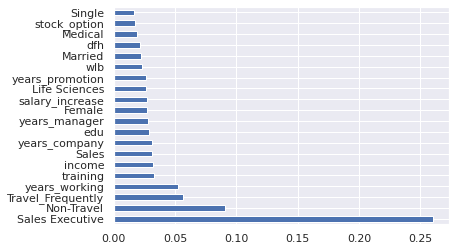

In [318]:
feat_importances = pd.Series(model_xgb.feature_importances_, index=X_enc_new.columns)
feat_importances.nlargest(20).plot(kind='barh')

In [319]:
explainer = shap.TreeExplainer(model_xgb)

In [320]:
shap_values = explainer.shap_values(X_enc_new)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


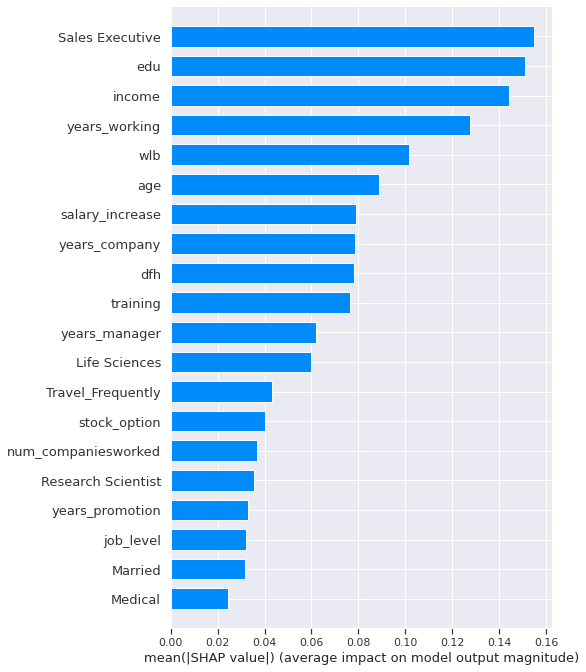

In [321]:
shap.summary_plot(shap_values, X_enc_new, plot_type="bar")

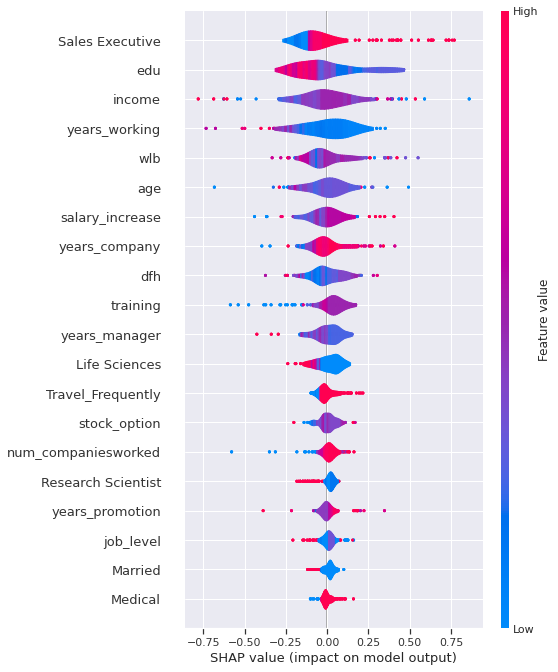

In [322]:
shap.summary_plot(shap_values, X_enc_new, plot_type='violin')

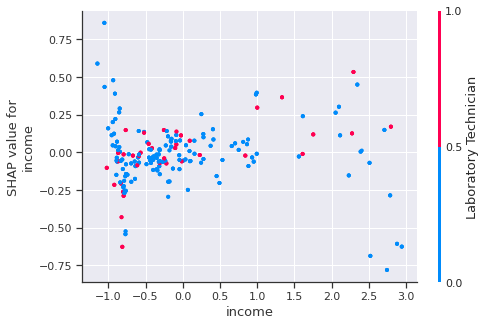

In [323]:
shap.dependence_plot("income", shap_values, X_enc_new)

In [324]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1,:], X_enc_new.iloc[1,:])

# 8.compensation analysis

## 8.1 income diagnosis with boxplot

In [327]:
hru.job_role.unique()

array(['Healthcare Representative', 'Research Scientist',
       'Sales Executive', 'Human Resources', 'Research Director',
       'Laboratory Technician', 'Manufacturing Director',
       'Sales Representative', 'Manager'], dtype=object)

In [328]:
hru_healthcarerepresentative=hru.loc[(hru['job_role']=='Healthcare Representative')]
hru_researchscientist=hru.loc[(hru['job_role']=='Research Scientist')]
hru_salesexecutive=hru.loc[(hru['job_role']=='Sales Executive')]
hru_humanresources=hru.loc[(hru['job_role']=='Human Resources')]
hru_researchdirector=hru.loc[(hru['job_role']=='Research Director')]
hru_laboratorytechnician=hru.loc[(hru['job_role']=='Laboratory Technician')]
hru_manufacturingdirector=hru.loc[(hru['job_role']=='Manufacturing Director')]
hru_salesrepresentative=hru.loc[(hru['job_role']=='Sales Representative')]
hru_manager=hru.loc[(hru['job_role']=='Manager')]

In [329]:
hru_healthcarerepresentative

,employee_id,age,dfh,edu,job_level,income,stock_option,salary_increase,training,years_company,...,satisfaction_job,wlb,attrition_d,business_travel,department,edu_field,gender,job_role,marital,cluster
0,1,51,6,2,1,131160,0,11,6,1,...,4.0,2.0,0,Travel_Rarely,Sales,Life Sciences,Female,Healthcare Representative,Married,2
14,16,37,1,3,2,53460,0,11,2,5,...,4.0,4.0,0,Travel_Rarely,Research & Development,Life Sciences,Male,Healthcare Representative,Married,2
60,64,31,24,3,2,10810,3,11,4,7,...,4.0,3.0,0,Travel_Rarely,Sales,Life Sciences,Male,Healthcare Representative,Divorced,2
61,65,32,7,3,2,24720,0,13,2,7,...,4.0,2.0,0,Travel_Rarely,Research & Development,Technical Degree,Male,Healthcare Representative,Single,2
68,72,47,4,3,2,59060,0,23,4,3,...,3.0,3.0,0,Travel_Rarely,Research & Development,Life Sciences,Female,Healthcare Representative,Married,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4255,4364,30,17,4,2,64300,1,12,2,11,...,3.0,3.0,0,Non-Travel,Research & Development,Life Sciences,Male,Healthcare Representative,Single,1
4260,4369,30,3,2,2,28620,0,14,2,6,...,1.0,2.0,1,Travel_Frequently,Sales,Medical,Male,Healthcare Representative,Single,3
4264,4373,36,16,4,1,67350,2,25,3,13,...,2.0,4.0,0,Travel_Rarely,Research & Development,Life Sciences,Male,Healthcare Representative,Single,0
4276,4385,59,4,4,1,27600,0,11,3,2,...,3.0,2.0,0,Travel_Rarely,Research & Development,Technical Degree,Male,Healthcare Representative,Married,2


In [330]:
sns.set_style("white")

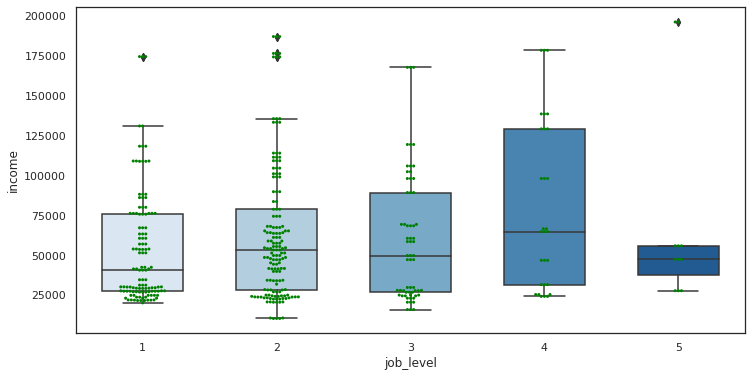

In [331]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_healthcarerepresentative, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_healthcarerepresentative, color="green",size=3)

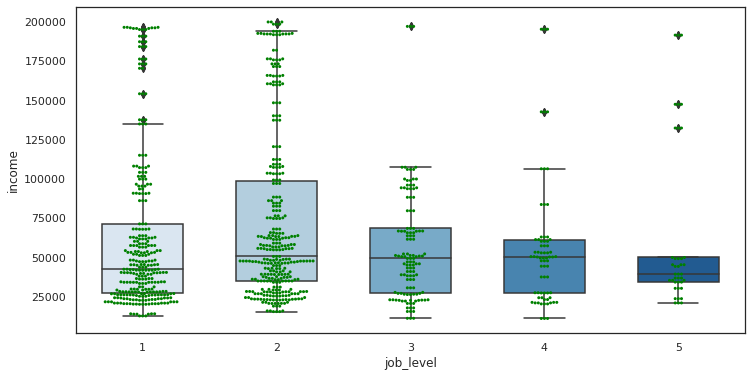

In [332]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_researchscientist, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_researchscientist, color="green",size=3)

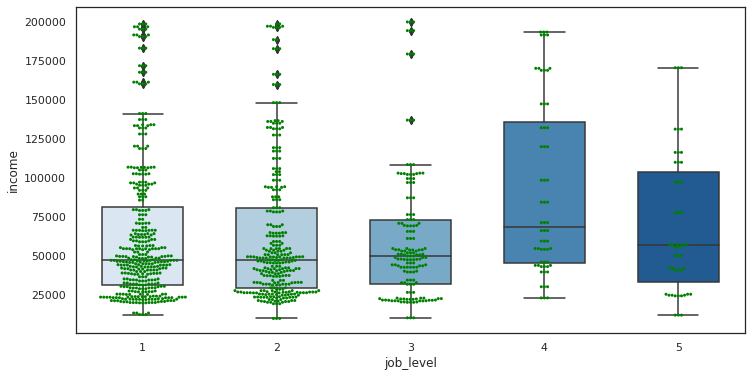

In [333]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_salesexecutive, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_salesexecutive, color="green",size=3)

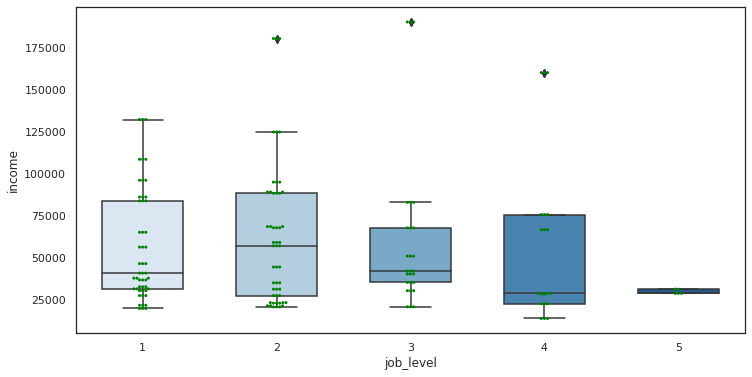

In [334]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_humanresources, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_humanresources, color="green",size=3)

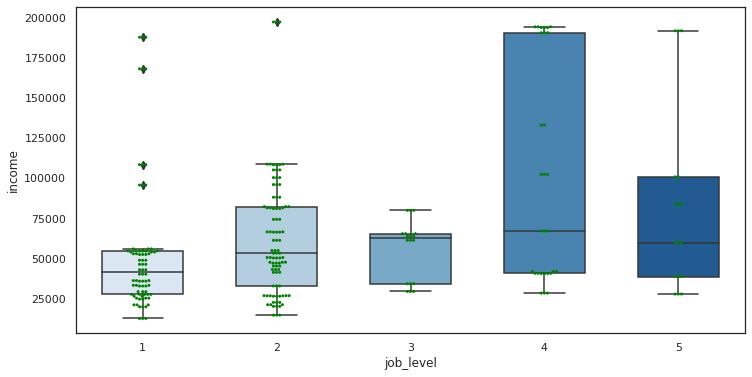

In [335]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_researchdirector, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_researchdirector, color="green",size=3)

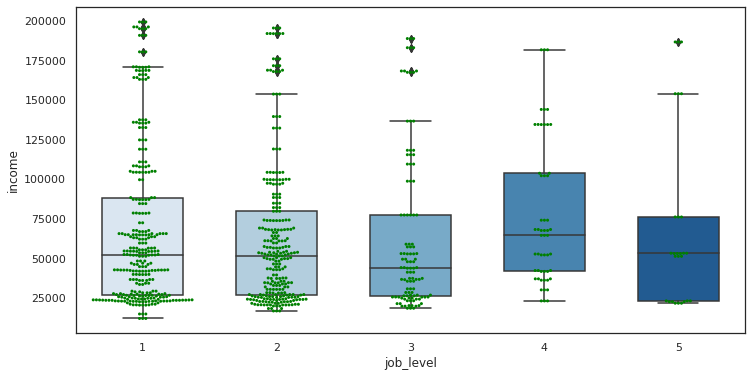

In [336]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_laboratorytechnician, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_laboratorytechnician, color="green",size=3)

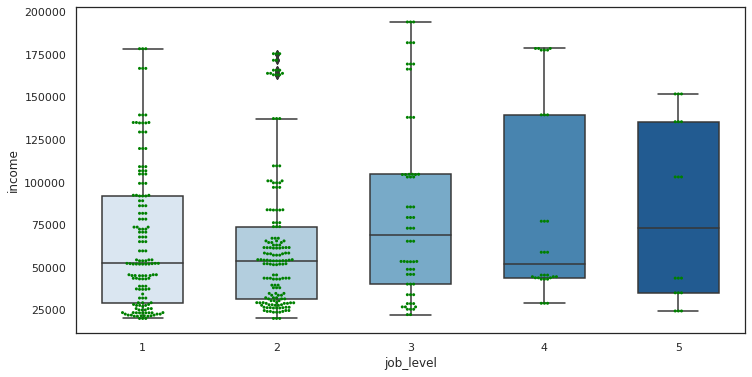

In [337]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_manufacturingdirector, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_manufacturingdirector, color="green",size=3)

In [ ]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_salesrepresentative, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_salesrepresentative, color="green",size=3)

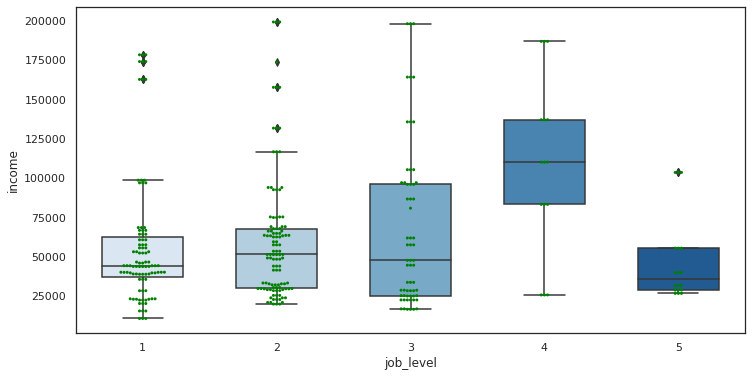

In [338]:
f, ax = plt.subplots(figsize=(12, 6))
fig = sns.boxplot(x='job_level', y="income", data=hru_manager, palette="Blues",width=0.6)
fig1 = sns.swarmplot(x='job_level', y="income", data=hru_manager, color="green",size=3)

## 8.2 stock option analysis

In [339]:
hrso=pd.crosstab(hru.job_level,hru.stock_option)

In [340]:
hruso=hru.loc[(hru['stock_option']!= 0)]

In [343]:
import joypy

<Figure size 240x160 with 0 Axes>

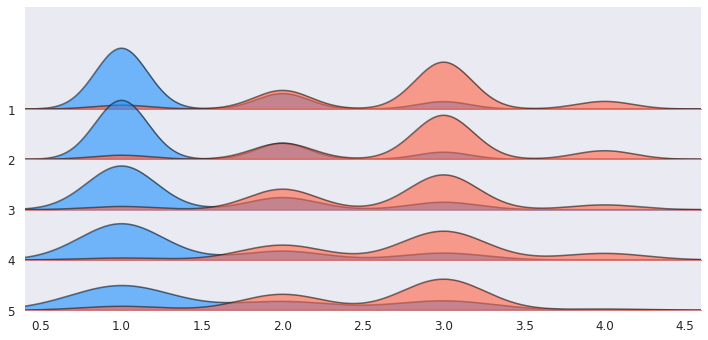

In [344]:
plt.figure(figsize=(3,2), dpi= 80)

fig, axes = joypy.joyplot(hruso, column=['stock_option','job_involvement'], by="job_level", ylim=(0,3), alpha=.6,figsize=(10,5),color=['dodgerblue','tomato'])